<h1 align="center">Volume 2: The Fourier Transform.</h1>

    <Name> Sam Carpenter
    <Class> Section 3
    <Date> 11/30/20

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [100]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
from scipy.fftpack import fft, ifft, fft2, ifft2
from scipy import signal
import numpy as np
import IPython
import imageio

In [63]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [64]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples

    # Problems 1.1 and 1.7
    def plot(self, dft = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        """length = len(self.samples) / self.rate
        if not dft:
            plt.title("Sound Wave")
            plt.ylim(-32768, 32767)
            plt.xlim(0, length)
            plt.xlabel("Seconds")
            plt.ylabel("Amplitude")
            x = np.linspace(0, length, len(self.samples))
            plt.plot(x, self.samples, lw=.5)
        else:
            fig, axs = plt.subplots(1, 2)
            
            axs[0].set_title("Sound Wave")
            axs[0].set_ylim(-32768, 32767)
            axs[0].set_xlim(0, length)
            axs[0].set_xlabel("Seconds")
            axs[0].set_ylabel("Amplitude")
            x = np.linspace(0, length, len(self.samples))
            axs[0].plot(x, self.samples, lw=.5)
            
            axs[1].set_title("DFT Graph")
            axs[1].set_ylim(0, 44100)
            axs[1].set_xlim(0, 22050)
            axs[1].set_xlabel("Frequency (Hz)")
            axs[1].set_ylabel("Magnitude")
            
            #n = len(self.samples)
            
            dftCoefficients = np.abs(fft(self.samples))
            n = dftCoefficients.shape[0]
            mid = n // 2
            hertz = np.arange(n) * self.rate / n
            axs[1].plot(hertz[:mid], dftCoefficients[:mid], lw=.5)
        plt.show()"""
        
        
        
        fig = plt.figure()
        if dft:
            ax1 = fig.add_subplot(121)
            ax2 = fig.add_subplot(122)
            
            dftCoefficients = np.abs(fft(self.samples))
            n = dftCoefficients.shape[0]
            x = np.arange(n) * self.rate / n
            mid = n // 2
            
            ax2.plot(x[:mid], dftCoefficients[:mid], lw=.5)
            ax2.set_xlabel("Frequency (Hz)")
            ax2.set_ylim(ymin=0)
            ax2.set_xlim(xmin=0)
            ax2.set_ylabel("Magnitude")
            ax2.set_title("DFT Graph")
        else:
            ax1 = fig.add_subplot(111)
        
        ax1.set_title("Sound Wave")
        ax1.plot(np.arange(len(self.samples))/self.rate, self.samples, lw=.5)
        ax1.set_xlabel("Seconds")
        ax1.set_ylim(-32768, 32767)
        ax1.set_ylabel("Amplitude")
        
        plt.show()

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        #print(type(self.samples[0]))
        #print(type(np.int16(self.samples[0])))
        samples = self.samples.real
        if force or type(samples[0]) != type(np.int16(samples[0])):
            #print("Scaled")
            newSamples = np.int16(samples / max(abs(samples)) * 32767)
            #print(type(newSamples[0]))
            wavfile.write(filename, self.rate, newSamples)
        else:
            #print("Not scaled")
            wavfile.write(filename, self.rate, samples)
        return
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        if len(self.samples) != len(other.samples):
            raise ValueError("Sample arrays are not the same length")
        newSamples = self.samples + other.samples
        #print(len(self.samples))
        #print(len(newSamples))
        return SoundWave(self.rate, newSamples)

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("Sample rates are not the equal")
        newSamples = np.concatenate((self.samples, other.samples))
        return SoundWave(self.rate, newSamples)
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("Sample rates are not the equal")
        paddedSamples = None
        convolution = None
        if len(self.samples) < len(other.samples):
            paddedSamples = np.zeros(len(other.samples))
            paddedSamples[:len(self.samples)] = self.samples
            convolution = ifft(np.multiply(fft(paddedSamples), fft(other.samples)))
        elif len(self.samples) > len(other.samples):
            paddedSamples = np.zeros(len(self.samples))
            paddedSamples[:len(other.samples)] = other.samples
            convolution = ifft(np.multiply(fft(self.samples), fft(paddedSamples)))
        else:
            convolution = ifft(np.multiply(fft(self.samples), fft(other.samples)))
        
        return SoundWave(self.rate, convolution)

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("Sample rates are not the equal")
        
        length = len(self.samples) + len(other.samples) - 1
        
        a = 1
        while 2 ** a < length:
            a += 1
        
        paddedSelfSamples = np.zeros(2 ** a)
        paddedSelfSamples[:len(self.samples)] = self.samples
        
        paddedOtherSamples = np.zeros(2 ** a)
        paddedOtherSamples[:len(other.samples)] = other.samples

        convolution = ifft(np.multiply(fft(paddedSelfSamples), fft(paddedOtherSamples)))
        
        return SoundWave(self.rate, convolution[:length])
    
    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        n = len(self.samples)
        kLow = (low_freq * n // self.rate)
        kHigh = (high_freq * n // self.rate)
        dftCoefficients = fft(self.samples)
        dftCoefficients[kLow:kHigh] = 0
        dftCoefficients[-kHigh:-kLow] = 0
        self.samples = ifft(dftCoefficients).real
        

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

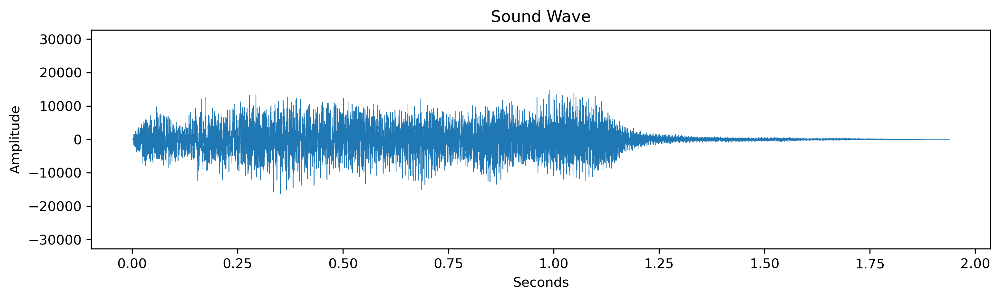

In [65]:
rate, samples = wavfile.read("tada.wav")
sw = SoundWave(rate, samples)
sw.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [66]:
IPython.display.Audio(filename = "tada.wav")

In [67]:
sw.export("originalTada.wav")
IPython.display.Audio(filename = "originalTada.wav")

In [68]:
sw.export("scaledTada.wav", True)
IPython.display.Audio(filename = "scaledTada.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [69]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    sampleRate = 44100
    x = np.linspace(0, duration, int(sampleRate * duration))
    #print(len(x))
    noteSamples = np.sin(2 * np.pi * frequency * x)
    #print(noteSamples)
    #print(len(noteSamples))
    return SoundWave(sampleRate, noteSamples)

In [70]:
noteA = generate_note(440, 2)
noteA.export("noteA.wav")
IPython.display.Audio(filename = "noteA.wav")

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [71]:
noteA3 = generate_note(440, 3)
noteC3 = generate_note(523.25, 3)
noteE3 = generate_note(659.25, 3)
AMinorChord = noteA3 + noteC3 + noteE3
AMinorChord.export("AMinorChord.wav")
IPython.display.Audio(filename = "AMinorChord.wav")

In [72]:
noteA1 = generate_note(440, 1)
noteC1 = generate_note(523.25, 1)
noteE1 = generate_note(659.25, 1)
AMinorArpegio = noteA1 >> noteC1 >> noteE1
AMinorArpegio.export("AMinorArpegio.wav")
IPython.display.Audio(filename = "AMinorArpegio.wav")

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [73]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    n = len(samples)
    w = np.exp(2 * np.pi * 1j / n)
    return (1 / n) * np.array([[w**(-i*j) for i in range(n)] for j in range(n)]) @ samples

In [74]:
#testSample = np.array([1,2,3,4])
#testDFT = simple_dft(testSample)
#print(np.allclose(testDFT, (1/4)*fft(testSample)))
randomSample = np.random.rand(6)
randomTestDFT = simple_dft(randomSample)
print(np.allclose(randomTestDFT, (1/6)*fft(randomSample)))

True


### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [75]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    def split(g):
        n = len(g)
        if n <= threshold:
            return n * simple_dft(g)
        even = split(g[::2])
        odd = split(g[1::2])
        z = np.array([np.exp(-2 * np.pi * 1j * k / n) for k in range(n)])
        m = n // 2
        return np.hstack((even + np.multiply(z[:m], odd), even + np.multiply(z[m:], odd)))
    return split(samples) / len(samples)

In [76]:
n = 8192
randomSample = np.random.rand(n)
%time randomTestDFT = simple_dft(randomSample)
%time randomTestFFT = simple_fft(randomSample)
%time randomFFT = fft(randomSample) / n
randomTestFFT = simple_fft(randomSample)
randomFFT = fft(randomSample) / n
print(np.allclose(randomTestFFT, randomFFT))

KeyboardInterrupt: 

Wall time: 349 ms
Wall time: 0 ns
True


### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

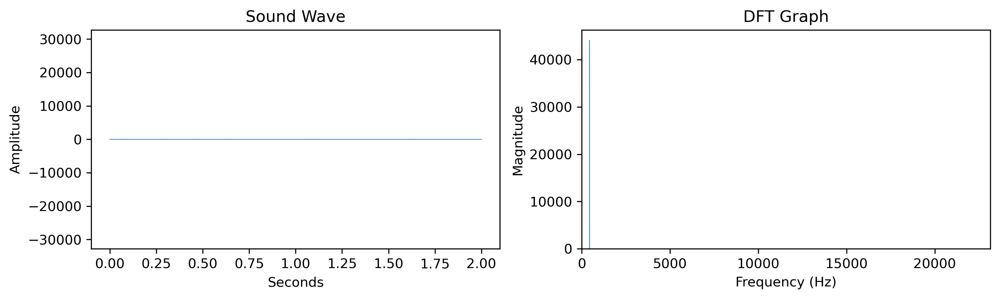

In [77]:
ANoteDemo = generate_note(440, 2)
ANoteDemo.plot(True)

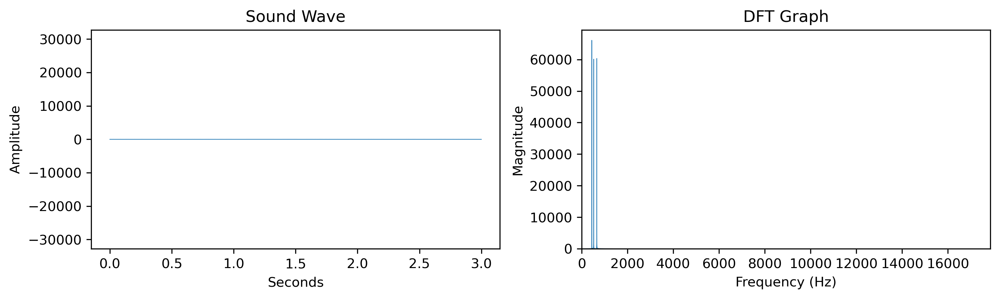

In [78]:
noteA3 = generate_note(440, 3)
noteC3 = generate_note(523.25, 3)
noteE3 = generate_note(659.25, 3)
AMinorChord = noteA3 + noteC3 + noteE3
AMinorChord.plot(True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

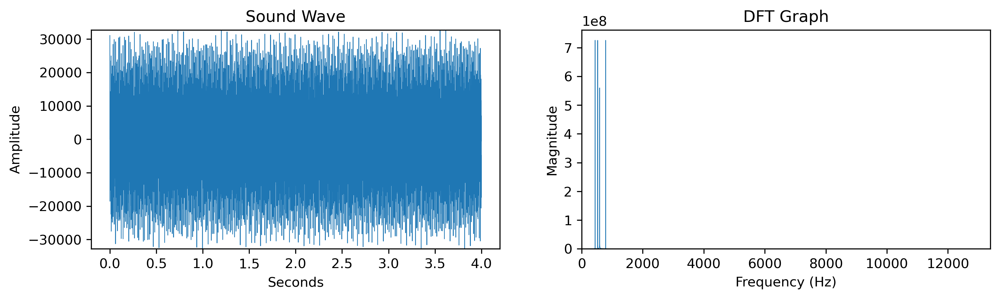

In [79]:
rate, samples = wavfile.read("mystery_chord.wav")
chord = SoundWave(rate, samples)
chord.plot(True)

The notes are... A, C, D, G

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [80]:
rate, samples = wavfile.read("tada.wav")
tada = SoundWave(rate, samples)

white_noise = np.random.randint(-32767, 32767, rate * 2, dtype=np.int16)
white = SoundWave(rate, white_noise)
white.export("whiteNoise.wav")
IPython.display.Audio(filename = "whiteNoise.wav")
#Why is my white noise 4 seconds and not 2 seconds?

In [81]:
convolution = sw * white
convolution.export("whiteNoiseTadaShort.wav")
IPython.display.Audio(filename = "whiteNoiseTadaShort.wav")

In [82]:
newSound = convolution >> convolution
newSound.export("whiteNoiseTada.wav")
IPython.display.Audio(filename = "whiteNoiseTada.wav")

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [83]:
rate, samples = wavfile.read("CGC.wav")
cgc = SoundWave(rate, samples)

rate, samples = wavfile.read("GCG.wav")
gcg = SoundWave(rate, samples)

%time linConvo = cgc ** gcg
%time linConvoScipy = signal.fftconvolve(cgc.samples, gcg.samples)

IPython.display.Audio(filename = "CGC.wav")

Wall time: 343 ms
Wall time: 131 ms


In [84]:
IPython.display.Audio(filename = "GCG.wav")

In [106]:
rate, samples = wavfile.read("CGC.wav")
cgc = SoundWave(rate, samples)

rate, samples = wavfile.read("GCG.wav")
gcg = SoundWave(rate, samples)

linConvo = cgc ** gcg
linConvo.export("GC_Convo.wav")
IPython.display.Audio(filename = "GC_Convo.wav")

In [86]:
rate, samples = wavfile.read("CGC.wav")
cgc = SoundWave(rate, samples)

rate, samples = wavfile.read("GCG.wav")
gcg = SoundWave(rate, samples)


samples = signal.fftconvolve(cgc.samples, gcg.samples)
linConvoScipy = SoundWave(rate, samples)
linConvoScipy.export("GC_Convo_Scipy.wav")
IPython.display.Audio(filename = "GC_Convo_Scipy.wav")

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [87]:
rate, samples = wavfile.read("chopin.wav")
chopin = SoundWave(rate, samples)

rate, samples = wavfile.read("balloon.wav")
balloon = SoundWave(rate, samples)

IPython.display.Audio(filename = "chopin.wav")

In [88]:
IPython.display.Audio(filename = "balloon.wav")

In [89]:
chopin_echo = chopin ** balloon
chopin_echo.export("chopin_echo.wav")
IPython.display.Audio(filename = "chopin_echo.wav")

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

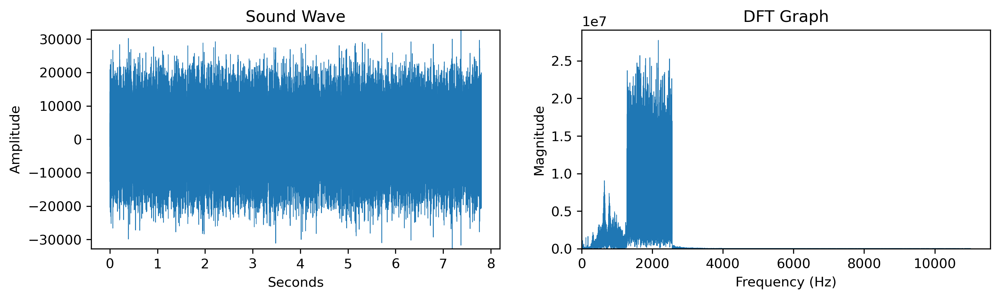

In [90]:
rate, samples = wavfile.read("noisy1.wav")
noisy1 = SoundWave(rate, samples)
noisy1.plot(True)
IPython.display.Audio(filename = "noisy1.wav")

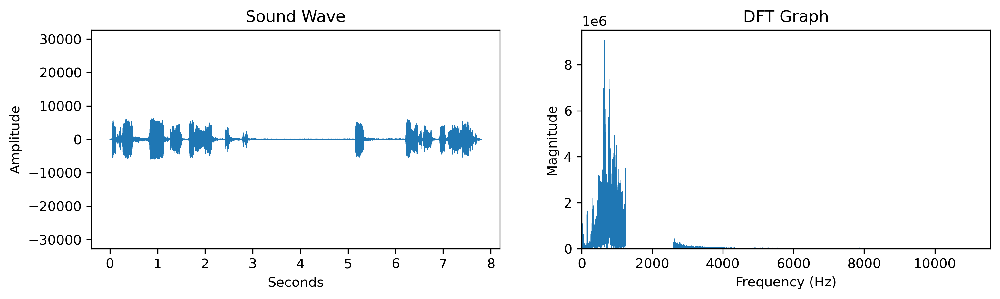

In [91]:
noisy1.clean(1250, 2600)
noisy1.export("noisy1_clean.wav")
noisy1.plot(True)
IPython.display.Audio(filename = "noisy1_clean.wav")
#My left graph looks wrong but the right graph looks right...

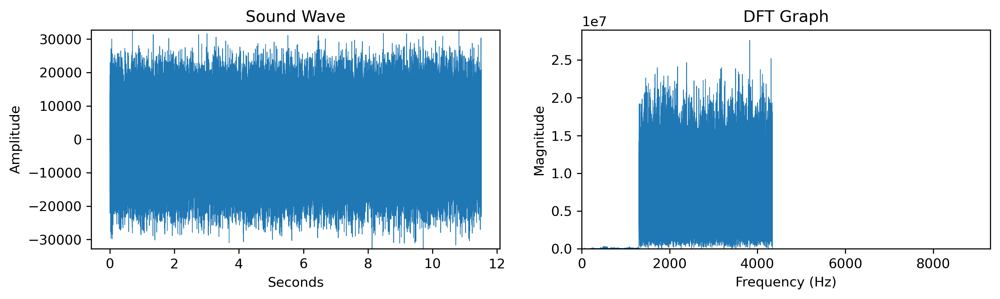

In [92]:
rate, samples = wavfile.read("noisy2.wav")
noisy2 = SoundWave(rate, samples)
noisy2.plot(True)
IPython.display.Audio(filename = "noisy2.wav")

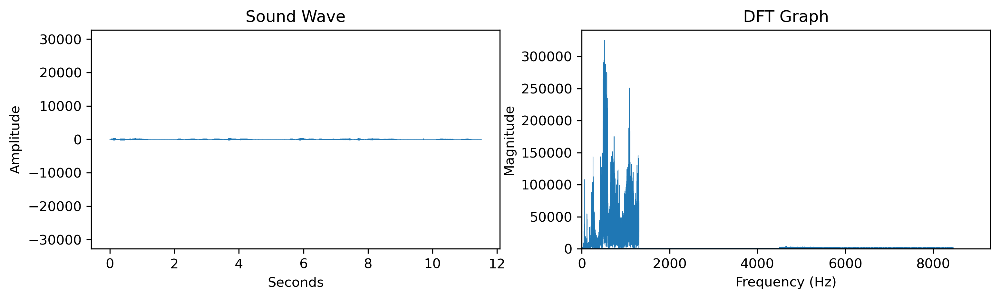

In [93]:
noisy2.clean(1300, 4500)
noisy2.export("noisy2_clean.wav")
noisy2.plot(True)
IPython.display.Audio(filename = "noisy2_clean.wav")
#My left graph looks wrong but the right graph looks right...

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

(529200, 2)


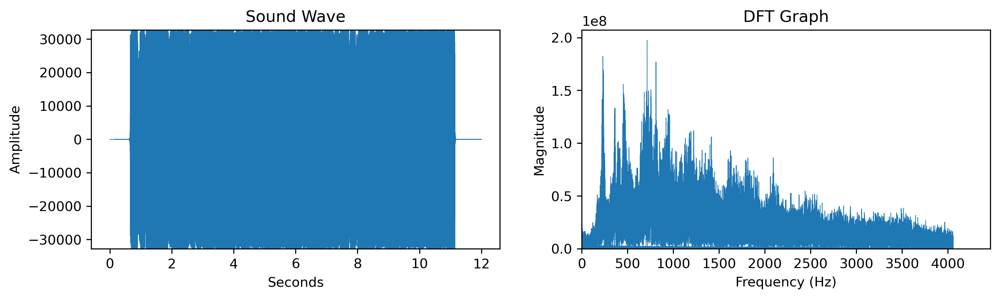

In [96]:
rate, samples = wavfile.read("vuvuzela.wav")
print(samples.shape)
vuvu1 = SoundWave(rate, samples[:, 0])
vuvu2 = SoundWave(rate, samples[:, 1])

vuvu2.plot(True)
IPython.display.Audio(filename = "vuvuzela.wav")

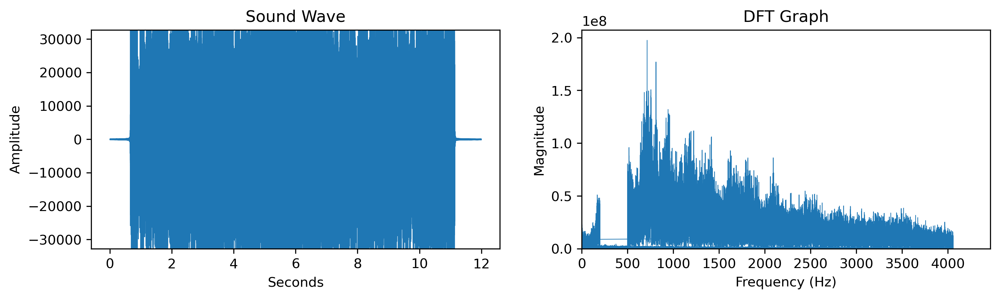

In [98]:
vuvu1.clean(200, 500)
vuvu2.clean(200, 500)
vuvu2.plot(True)
samples = np.vstack((vuvu1.samples, vuvu2.samples))
vuvu = SoundWave(rate, samples)
IPython.display.Audio(rate = rate, data = samples)
#Same problem as problem 4

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

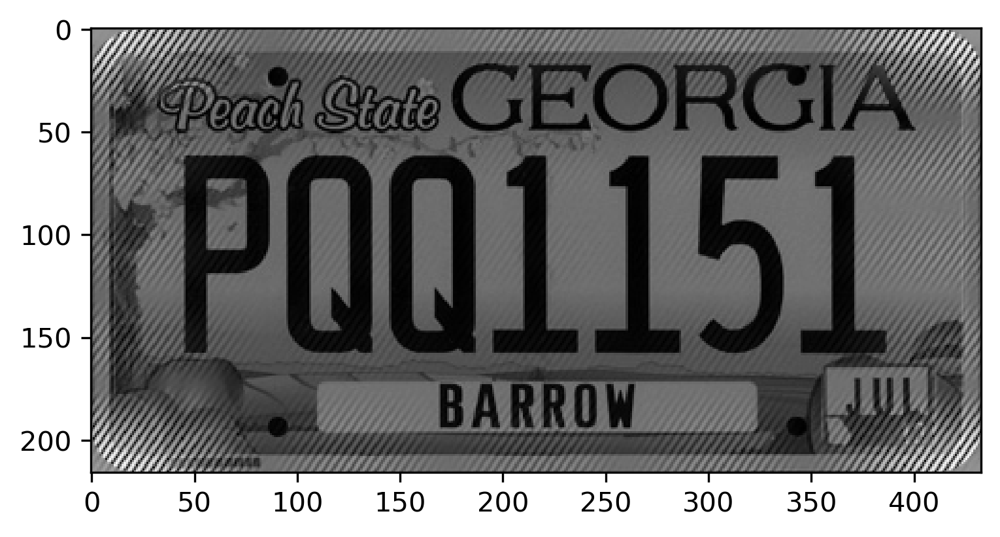

In [103]:
image = imageio.imread("license_plate.png")
im_dft = fft2(image)
plt.imshow(image, cmap="gray")
plt.show()

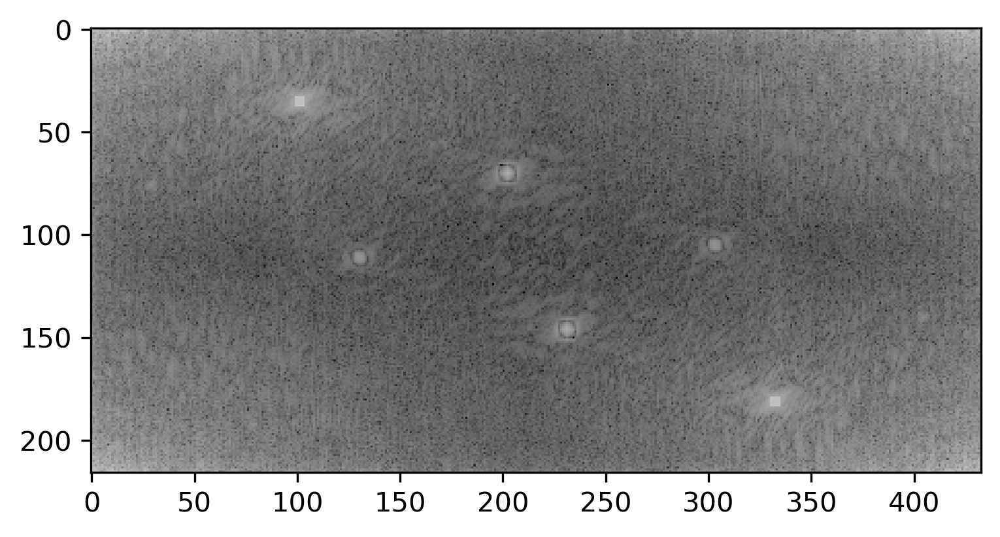

In [105]:
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.show()

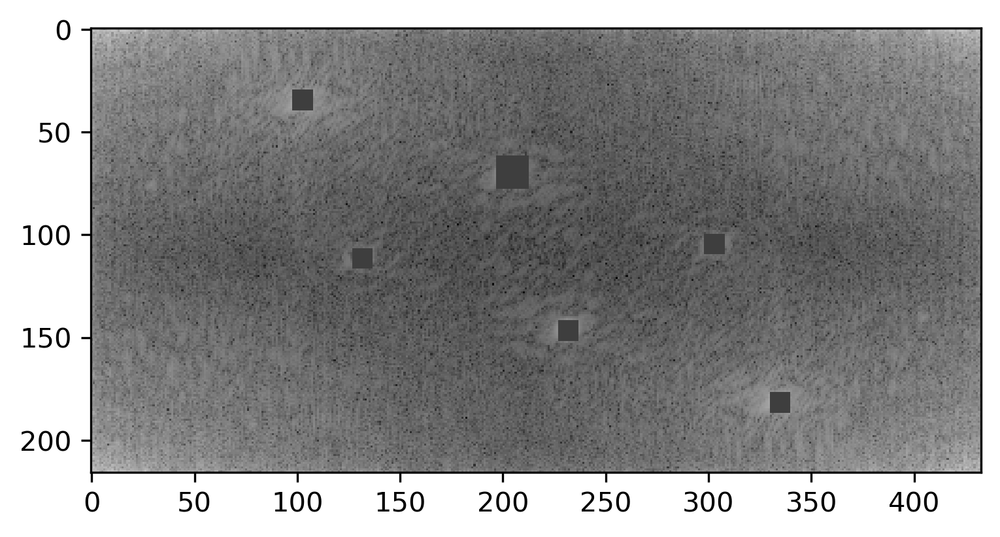

In [144]:
image = imageio.imread("license_plate.png")
im_dft = fft2(image)

#Filter out the spikes

mean = im_dft.mean()

im_dft[62:78, 197:213] = mean
im_dft[142:152, 227:237] = mean
im_dft[177:187, 330:340] = mean
im_dft[100:110, 298:308] = mean
im_dft[30:40, 98:108] = mean
im_dft[107:117, 127:137] = mean

#Show patched frequencies

plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.show()

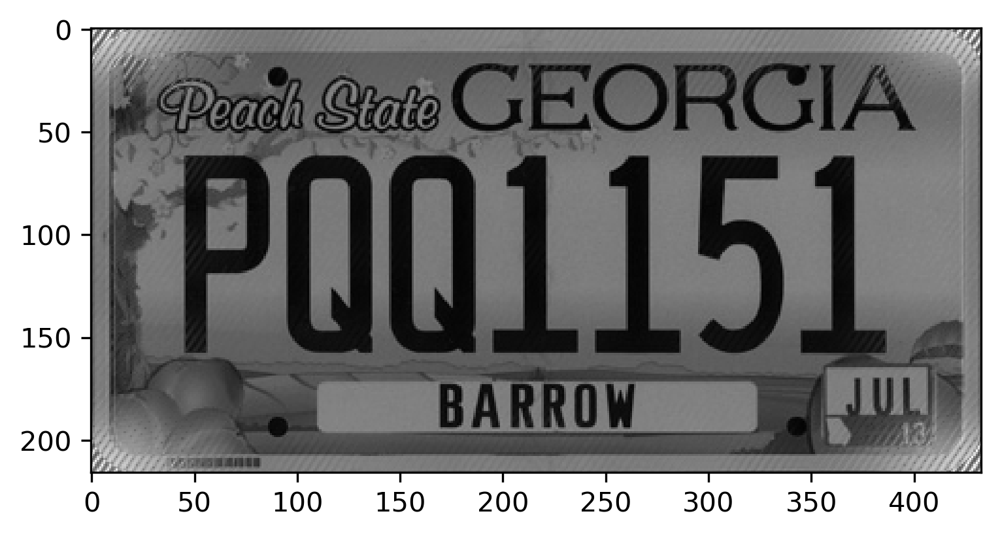

In [147]:
plt.imshow(ifft2(im_dft).real, cmap="gray")
plt.show()

The year on the sticker is...

In [ ]:
2013